In [1]:
data <- as.matrix(read.csv("GSE78220_PatientFPKM.csv", header=T, row.names=1))

In [2]:
print(dim(data))
head(data)

[1] 25268    28


,Pt1.baseline,Pt2.baseline,Pt4.baseline,Pt5.baseline,Pt6.baseline,Pt7.baseline,Pt8.baseline,Pt9.baseline,Pt10.baseline,Pt12.baseline,,Pt25.baseline,Pt27A.baseline,Pt27B.baseline,Pt28.baseline,Pt29.baseline,Pt31.baseline,Pt32.baseline,Pt35.baseline,Pt37.baseline,Pt38.baseline
A1BG,8.02538,317.594,5.747295,6.85957,1.563465,21.56585,11.37055,8.15681,4.34675,6.508715,⋯,40.40895,6.09381,7.191755,8.595985,5.46034,14.7886,17.3772,11.6442,15.0003,4.47517
A1BG-AS1,0.677503,28.3782,0.4713935,0.347623,0.20176,8.926245,3.853125,2.53961,1.91435,4.79793,⋯,0.4419245,0.2657695,0.5130155,1.3147535,3.15518,0.254531,0.67323,0.718414,0.388571,0.253978
A1CF,0,18.1094,0,0,0.011276185,0,0.00326287,0.001398225,0,0,⋯,0,0,0.001767905,0.188226,0.00951861,0,0,0,0,0
A2M,185.304,455.16,81.0082,41.41065,136.1635,44.66935,119.0175,232.675,501.697,530.2375,⋯,300.813,390.2995,364.5135,67.1145,557.9915,50.436,121.544,55.7139,39.6673,495.157
A2M-AS1,0.363531,2.864455,0.2012845,0.04082075,0.417423,1.039475,3.126025,4.2168,1.489845,1.86852,⋯,2.51109,0.3977165,0.284776,0.6277005,1.29522,0.129179,0.824253,0.172745,1.58721,1.04958
A2ML1,0.01413385,0.01269185,0.0225053,0.00383668,0,0.01084,0.044663,0.4475855,0.03080075,0.00737025,⋯,0.00993835,0.05038495,0.0118671,182.201,0.0100677,0,0,0,0,0


In [3]:
colnames(data) <- gsub("\\.[a-zA-Z]*", "", colnames(data))
print(colnames(data))

 [1] "Pt1"   "Pt2"   "Pt4"   "Pt5"   "Pt6"   "Pt7"   "Pt8"   "Pt9"   "Pt10" 
[10] "Pt12"  "Pt13"  "Pt14"  "Pt15"  "Pt16"  "Pt19"  "Pt20"  "Pt22"  "Pt23" 
[19] "Pt25"  "Pt27A" "Pt27B" "Pt28"  "Pt29"  "Pt31"  "Pt32"  "Pt35"  "Pt37" 
[28] "Pt38" 


In [4]:
head(data)

,Pt1,Pt2,Pt4,Pt5,Pt6,Pt7,Pt8,Pt9,Pt10,Pt12,,Pt25,Pt27A,Pt27B,Pt28,Pt29,Pt31,Pt32,Pt35,Pt37,Pt38
A1BG,8.02538,317.594,5.747295,6.85957,1.563465,21.56585,11.37055,8.15681,4.34675,6.508715,⋯,40.40895,6.09381,7.191755,8.595985,5.46034,14.7886,17.3772,11.6442,15.0003,4.47517
A1BG-AS1,0.677503,28.3782,0.4713935,0.347623,0.20176,8.926245,3.853125,2.53961,1.91435,4.79793,⋯,0.4419245,0.2657695,0.5130155,1.3147535,3.15518,0.254531,0.67323,0.718414,0.388571,0.253978
A1CF,0,18.1094,0,0,0.011276185,0,0.00326287,0.001398225,0,0,⋯,0,0,0.001767905,0.188226,0.00951861,0,0,0,0,0
A2M,185.304,455.16,81.0082,41.41065,136.1635,44.66935,119.0175,232.675,501.697,530.2375,⋯,300.813,390.2995,364.5135,67.1145,557.9915,50.436,121.544,55.7139,39.6673,495.157
A2M-AS1,0.363531,2.864455,0.2012845,0.04082075,0.417423,1.039475,3.126025,4.2168,1.489845,1.86852,⋯,2.51109,0.3977165,0.284776,0.6277005,1.29522,0.129179,0.824253,0.172745,1.58721,1.04958
A2ML1,0.01413385,0.01269185,0.0225053,0.00383668,0,0.01084,0.044663,0.4475855,0.03080075,0.00737025,⋯,0.00993835,0.05038495,0.0118671,182.201,0.0100677,0,0,0,0,0


In [5]:
# From fig S1
ress <- paste("Pt", c(14, 1, 7, 31, 20, 17, 30, 23, 29, 32, 16, 11, 12, 22, 25, 10, 36), sep="")
nonress <- paste("Pt", c(4, 27, 2, 26, 3, 7, 28, 5, 19, 13, 9, 8, 18, 33, 15, 34, 38, 21, 6, 35, 24), sep="")
labels <- rep("res", times=length(ress) + length(nonress))
names(labels) <- c(ress, nonress)
labels[nonress] <- "nonres"
labels <- labels[intersect(colnames(data), names(labels))]
labels <- as.factor(labels)
summary(labels)

nonres    res 
    13     12

In [6]:
colnames(data)[which(labels == "res")]

[1] "Pt1"   "Pt10"  "Pt12"  "Pt14"  "Pt16"  "Pt20"  "Pt22"  "Pt23"  "Pt25" 
[10] "Pt27B" "Pt28"  "Pt29"

In [7]:
examples <- c("AXL", "ROR2", "WNT5A", "TAGLN", "LOXL2", "TWIST2", 
              "CDH1", "FAP", "CCL2", "CCL7", "CCL8", "CCL13", "IL10", "VEGFC", "VEGFA")
examples <- intersect(rownames(data), examples)
examples

[1] "AXL"    "CCL13"  "CCL2"   "CCL7"   "CCL8"   "CDH1"   "FAP"    "IL10"  
 [9] "LOXL2"  "ROR2"   "TAGLN"  "TWIST2" "VEGFA"  "VEGFC"  "WNT5A"

In [50]:
pick <- function(x, label) {
    return(x[which(labels == label)])
}

logFold <- function(x) {
    xlog <- log2(x + .000001)  # to make all values non-zero
    logDiff <- sum(pick(xlog, "res")) - sum(pick(xlog, "nonres"))
    return(logDiff)
}

pVal <- function(x) {
    res <- wilcox.test(pick(x, "res"), pick(x, "nonres"), na.omit=TRUE)
    return(res$p.value)
}

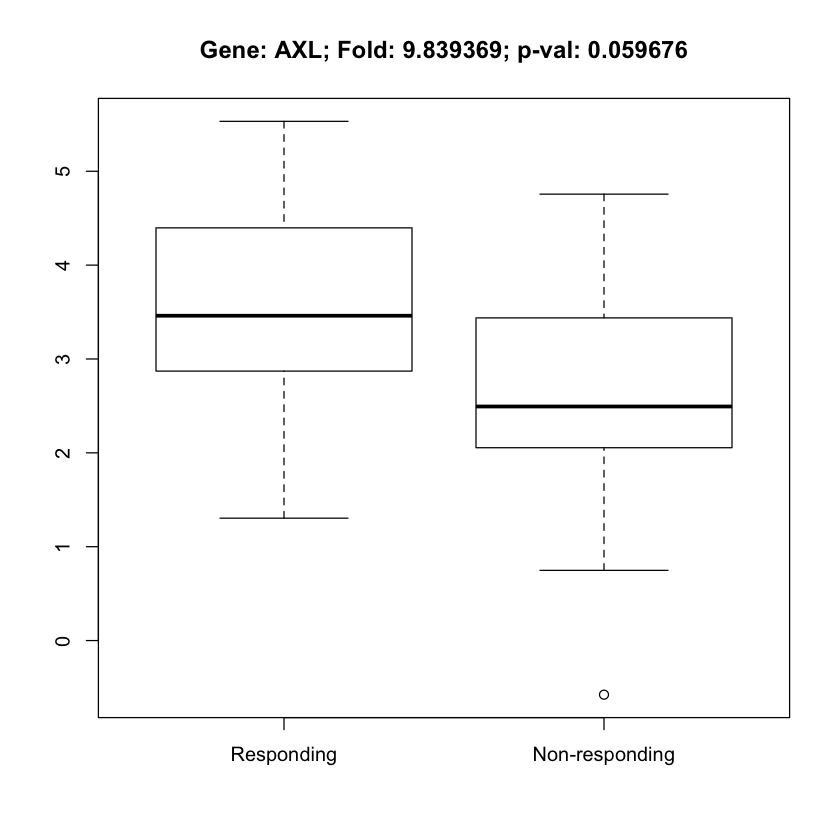

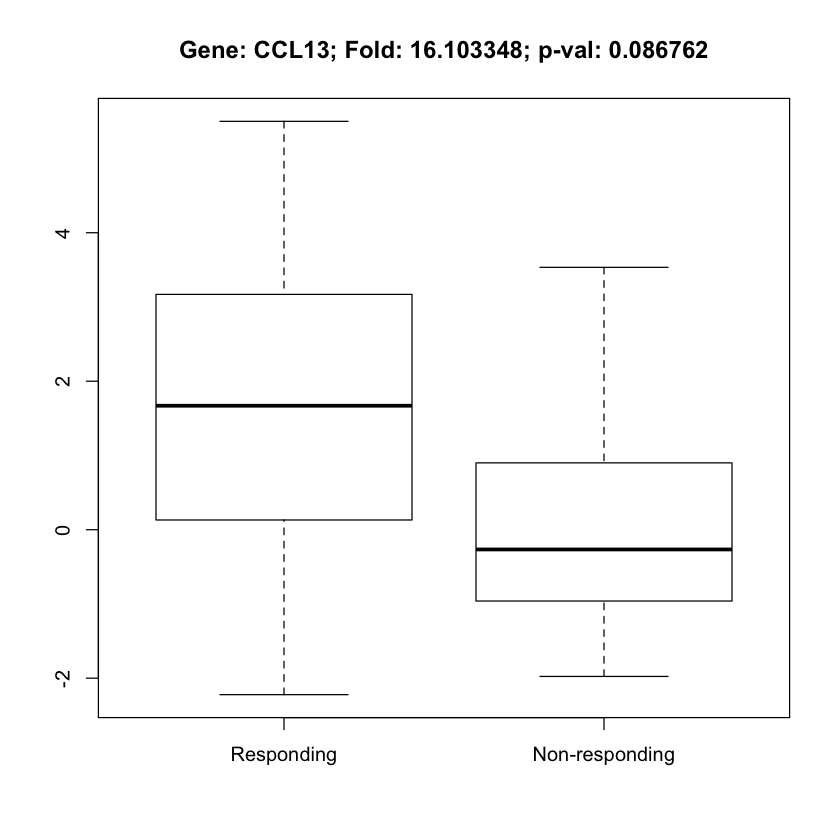

Warning message:
In bplt(at[i], wid = width[i], stats = z$stats[, i], out = z$out[z$group == : Outlier (-Inf) in boxplot 2 is not drawn

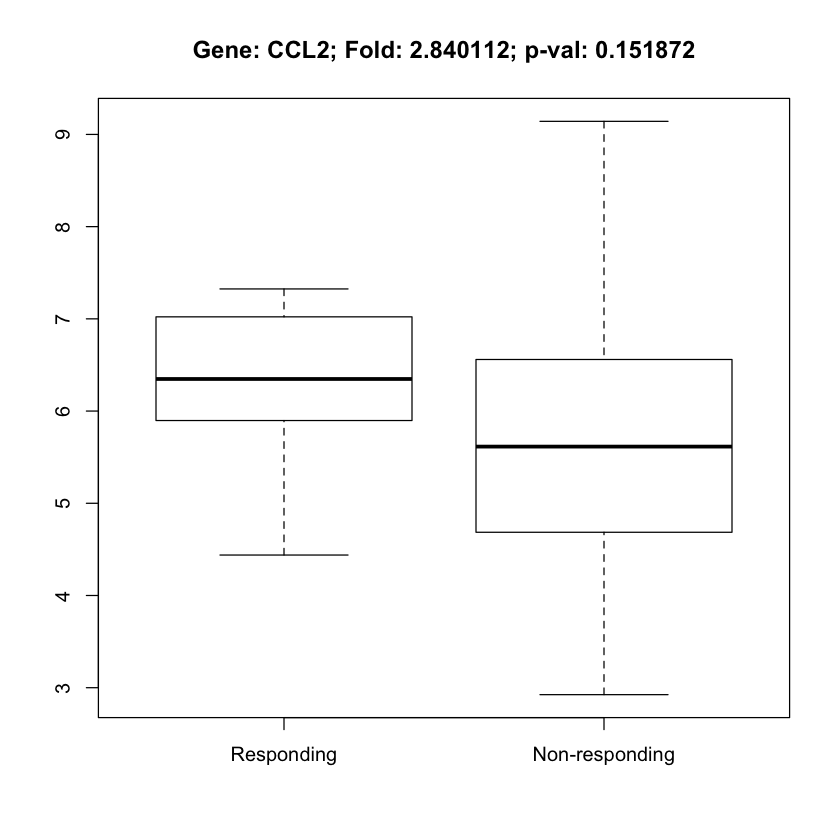

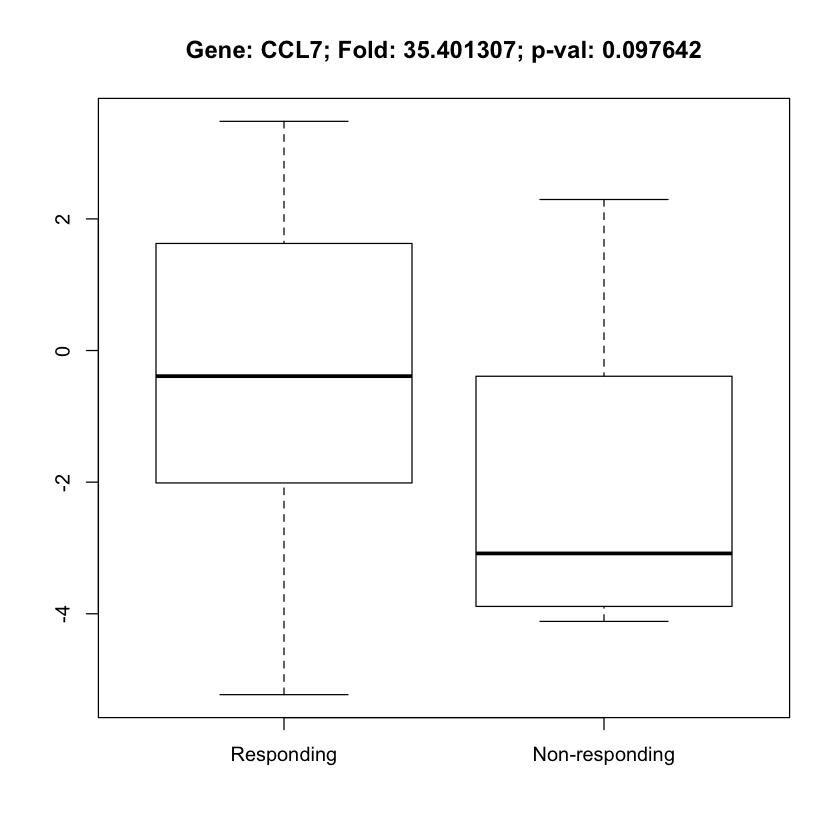

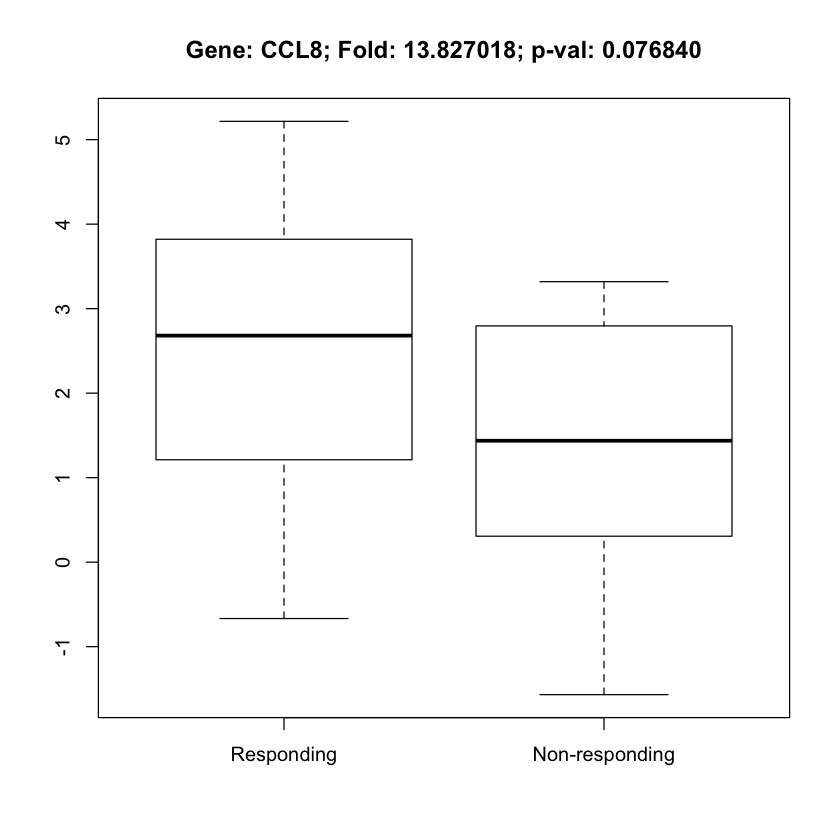

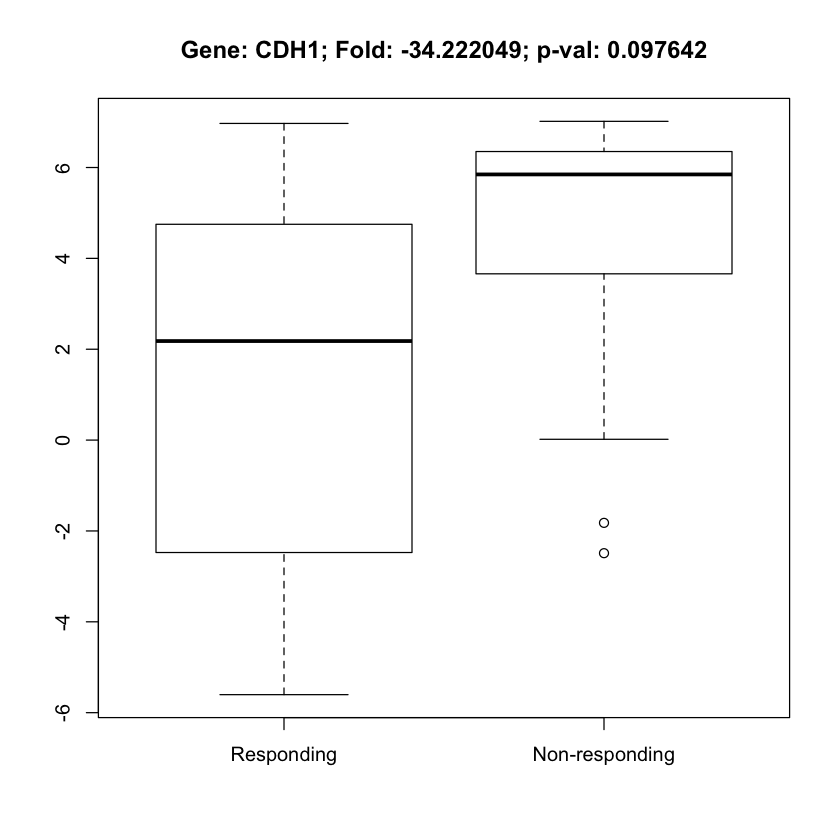

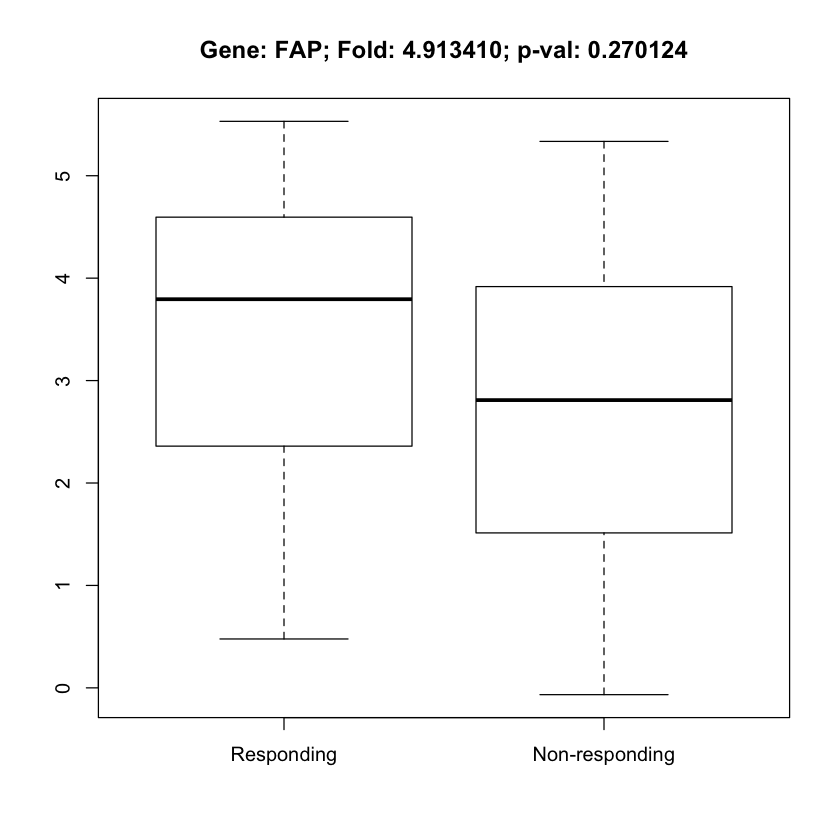

...

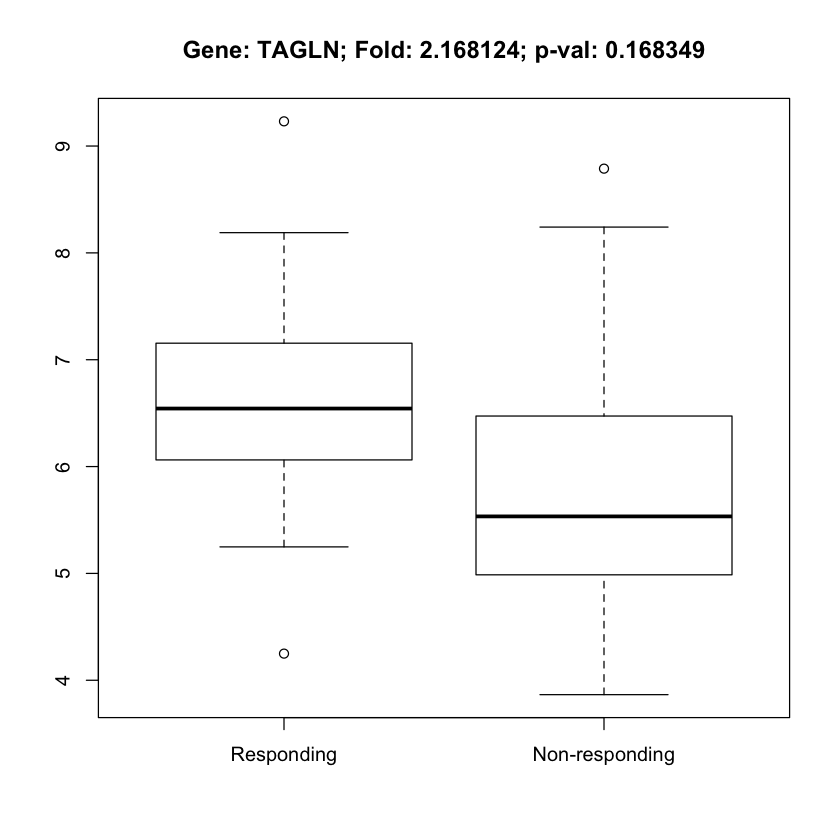

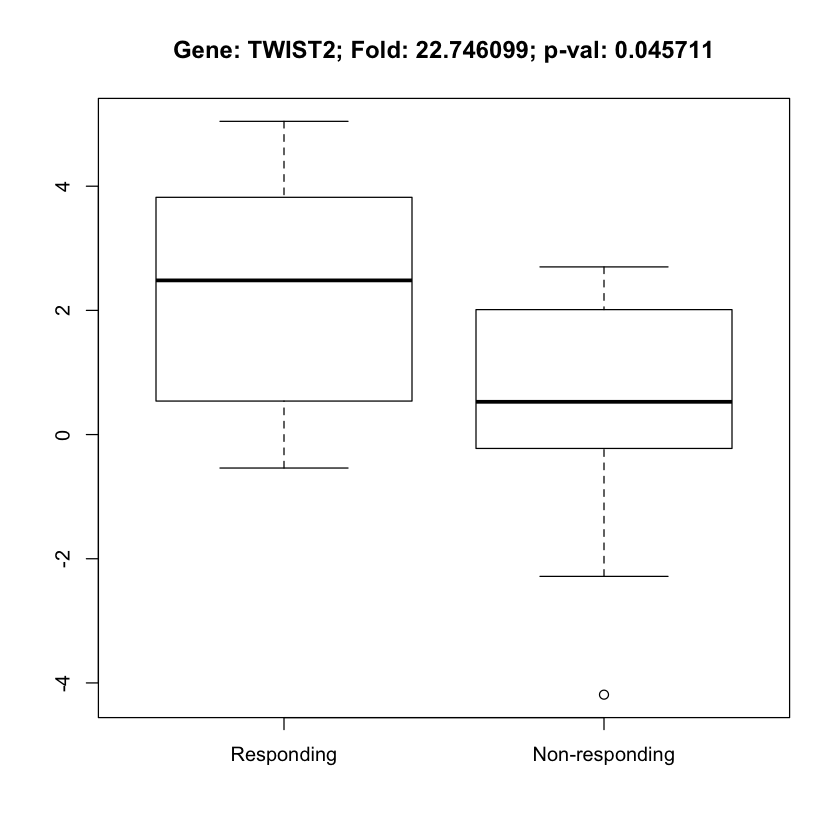

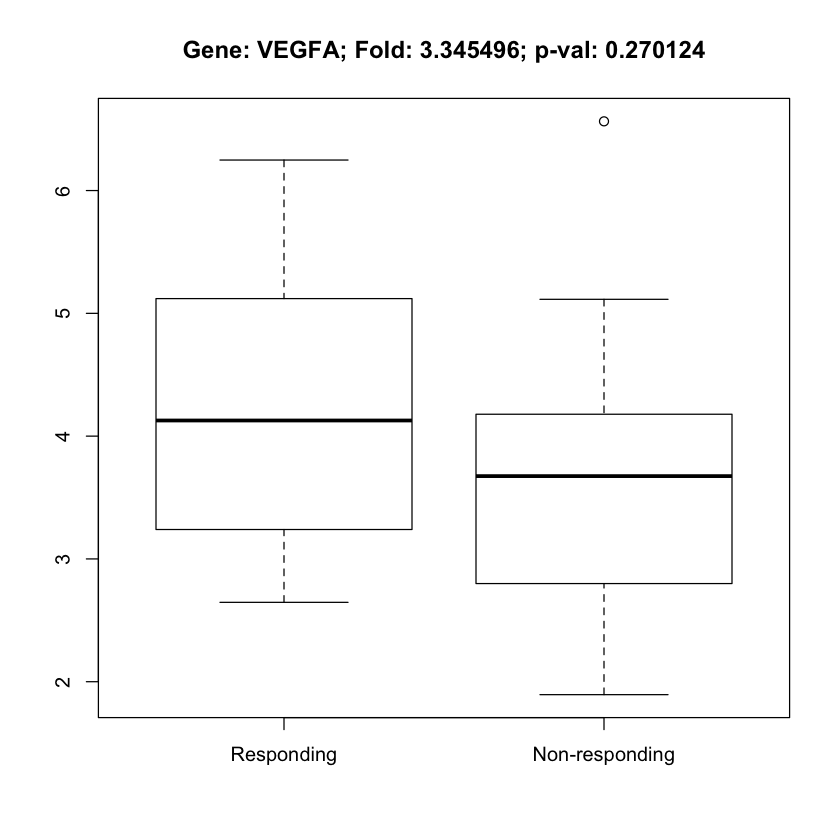

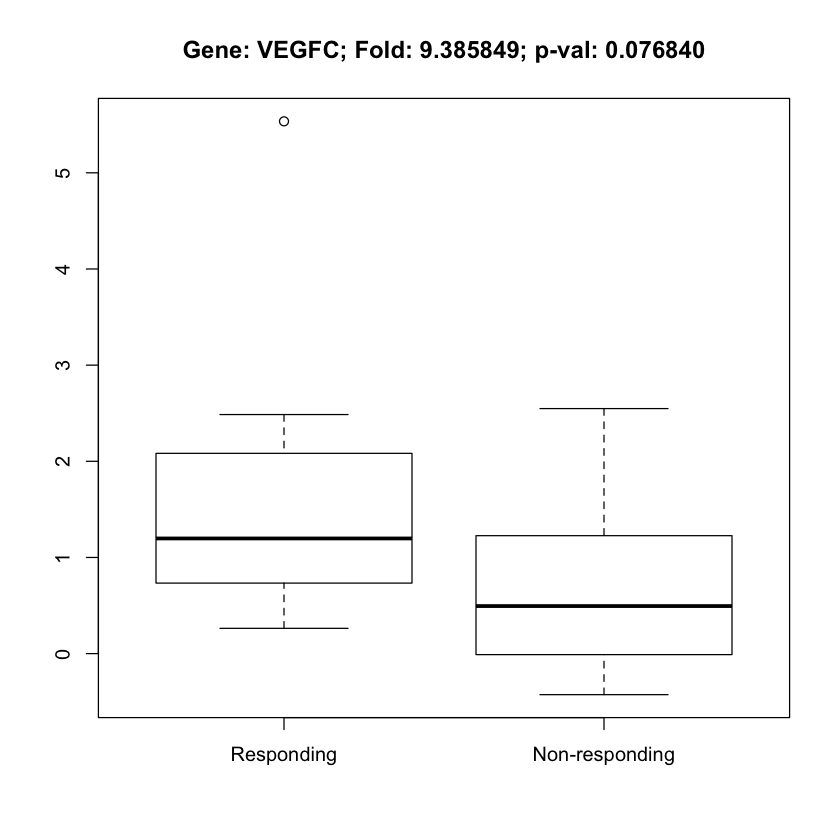

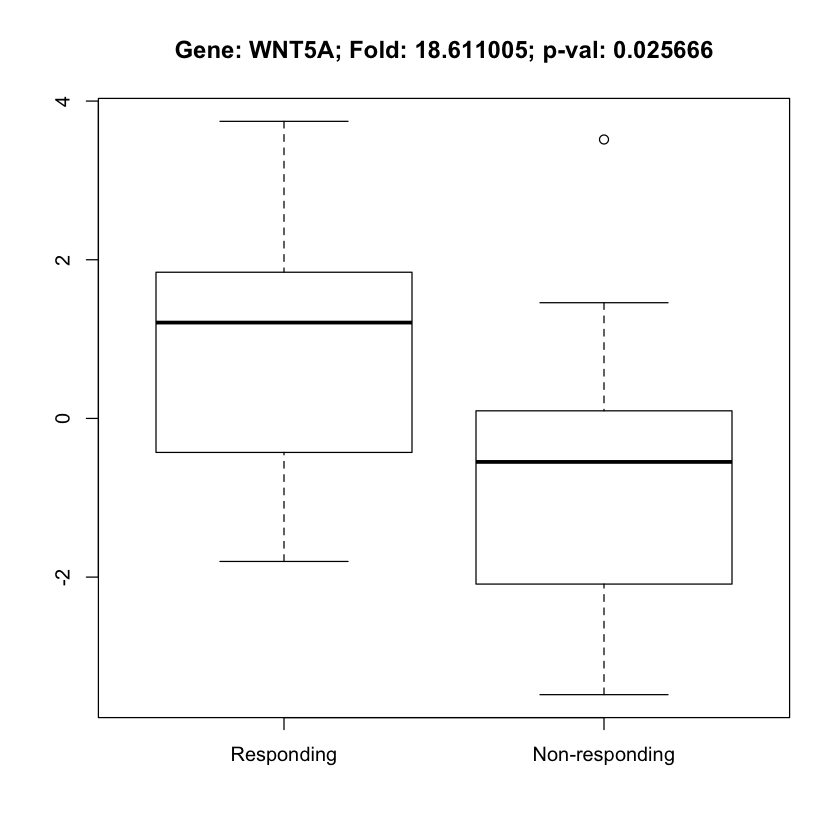

In [51]:
# try to reproduce examples in the paper
for(gene in examples) {
    geneData <- as.matrix(data[gene, ])
    ctitle <- sprintf("Gene: %s; Fold: %f; p-val: %f", gene, logFold(geneData), pVal(geneData))
    geneData <- log2(geneData)
    boxplot(pick(geneData, "res"), pick(geneData, "nonres"), names=c("Responding", "Non-responding"), main=ctitle)
}

In [52]:
meanExpression <- apply(data, MARGIN=1, FUN=mean)
# Filter low-expressed genes
data.f1 <- data[meanExpression > .1, ] 

logFoldChanges  <- apply(data.f1, MARGIN=1, FUN=logFold)
suppressWarnings(pVals <- apply(data.f1, MARGIN=1, FUN=pVal))

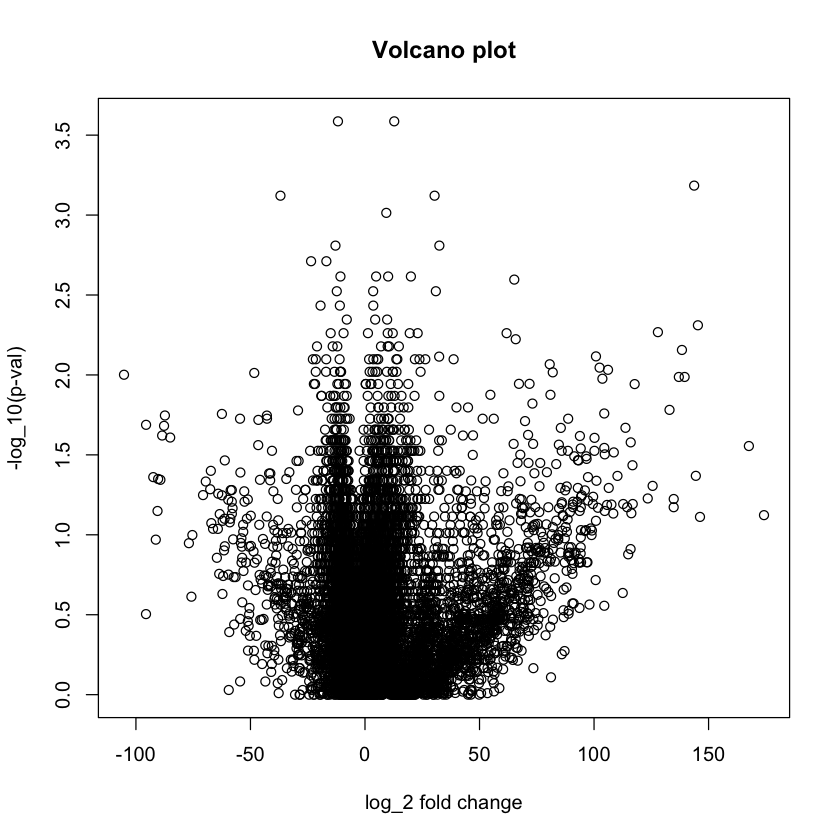

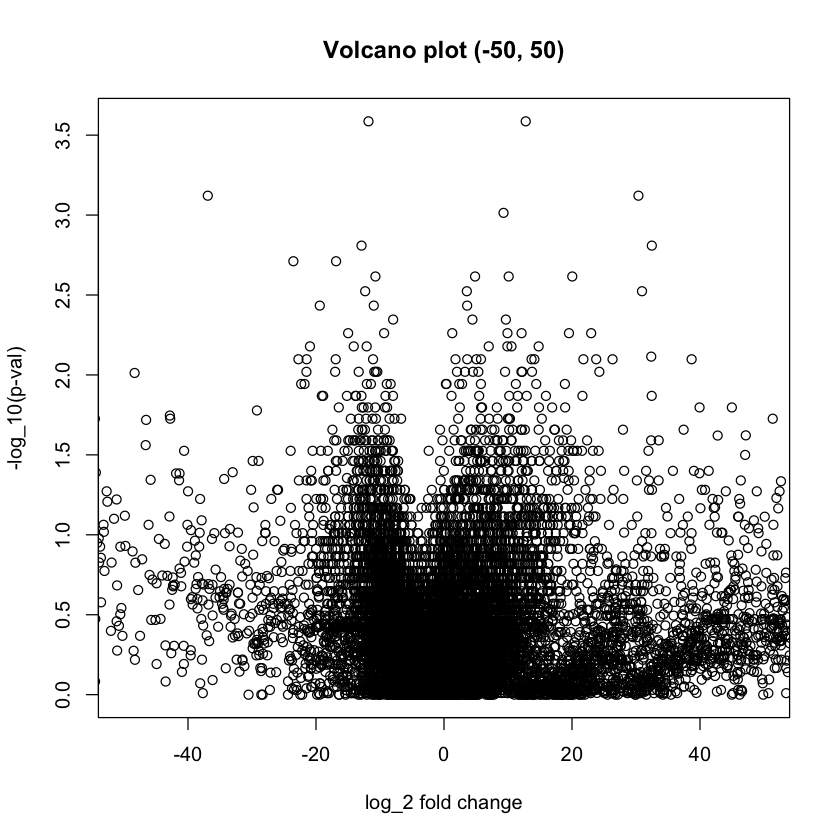

In [53]:
plot(logFoldChanges, -1 * log10(pVals), xlab="log_2 fold change", ylab="-log_10(p-val)", main="Volcano plot")
plot(logFoldChanges, -1 * log10(pVals), xlim=c(-50, 50), xlab="log_2 fold change", ylab="-log_10(p-val)", main="Volcano plot (-50, 50)")

In [54]:
fdrs <- p.adjust(pVals, method="fdr")
results <- data.frame(list(pVal=pVals, FDR=fdrs, foldChange=logFoldChanges), row.names=names(pVals))
results.sorted <- results[names(sort(pVals)), ]
head(results.sorted, n=50)

,pVal,FDR,foldChange
MLKL,0.0002592158,1,12.7688
ZFYVE1,0.0002592158,1,-11.80125
BPIFC,0.000654284,1,143.7065
ATP8A2,0.0007564948,1,-36.90745
MMRN1,0.0007564948,1,30.38159
GRK5,0.0009687903,1,9.300835
CH25H,0.001552603,1,32.47292
MIPEPP3,0.001552603,1,-12.88672
ZNF219,0.001944503,1,-16.86084
ZSWIM5,0.001944503,1,-23.53728


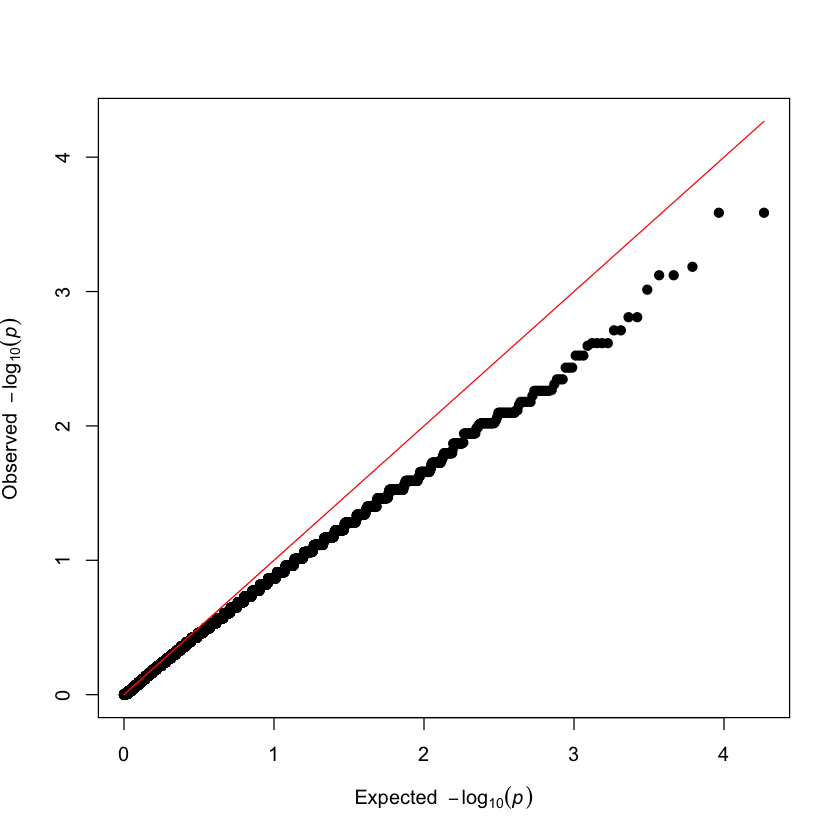

In [55]:
# http://GettingGeneticsDone.blogspot.com/
# See http://gettinggeneticsdone.blogspot.com/p/copyright.html

# Define the function
ggd.qqplot = function(pvector, main=NULL, ...) {
    o = -log10(sort(pvector,decreasing=F))
    e = -log10( 1:length(o)/length(o) )
    plot(e,o,pch=19,cex=1, main=main, ...,
        xlab=expression(Expected~~-log[10](italic(p))),
        ylab=expression(Observed~~-log[10](italic(p))),
        xlim=c(0,max(max(o),max(e))), ylim=c(0,max(max(o),max(e))))
    lines(e,e,col="red")
}
 
ggd.qqplot(pVals)